# <center> LDA per Pixcel</center>

1. Load data
2. Merge with Shp
2. Pre-Cleaning - Remove https
2. Combine text by pixcel
3. Language Detection - Select only English
4. Merge to Grid
5. Cleaning/Remove:  
    Stop words  
    Words Statistics(TF-IDF)  (需要吗)
6. LDA Model
7. Export

or merge all tweets and detect languegae afterwards(doesn't seems to make sense to me)

Introduction  
Github Notebook: https://github.com/wjbmattingly/topic_modeling_textbook

In [74]:
# https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#1introduction
import os
import re
import json
import glob
import string
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy
import spacy
from nltk.corpus import stopwords

# vis
import pyLDAvis
import pyLDAvis.gensim_models 

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Load Data 

## Load Twitter file 

In [3]:
# df to gdf
df = pd.read_csv('/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/Nairobi_1922/Sum/Clean1Tweets.csv', lineterminator='\n')

# # Drop Unwanted Columns
# df = df.drop(columns=['location'])

# DataFrame to GeoDataFrame
gdfTwitter = gpd.GeoDataFrame(df, geometry = [Point(xy) for xy in zip(df.lon, df.lat)])

# Add CRS
gdfTwitter.crs = 'epsg:4326'

# type(gdfTwitter)
gdfTwitter

,id,text,userid,lat,lon,created_at,geometry
0,1079755309281890305,Quick Pose Before The Vibe @KIZAnairobi @ KIZA...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083)
1,1079759392138907649,365/365 \n#whereveryouare #haveagoodone #beTha...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,POINT (36.81667 -1.28333)
2,1079760884526972928,"Happy 2019 from us @ Nairobi, Kenya https://t....",51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,POINT (36.81670 -1.28333)
3,1079762365644660736,"We ride together, We shine together. @ Nairobi...",89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,POINT (36.81670 -1.28333)
4,1079765001454477312,We set to usher in the new year 2019 in style ...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,POINT (36.80687 -1.26924)
...,...,...,...,...,...,...,...
324616,1542517996685369344,find only Kenyan tea and not a blend. I have o...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,POINT (36.82194 -1.29207)
324617,1542517994080702464,✦ [ Sakaja ]\n\nQuestion from an American\n\nh...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,POINT (36.82194 -1.29207)
324618,1542518238566703108,Just posted a photo @ Adams Arcade - Ngong Roa...,1339887369495916545,-1.300567,36.780725,2022-06-30 14:39:41+00:00,POINT (36.78072 -1.30057)
324619,1542521919118770184,You better recognize....\nOwner: @kemeigabriel...,839394178824028160,-1.283330,36.816700,2022-06-30 14:54:18+00:00,POINT (36.81670 -1.28333)


In [ ]:
#  ????????????????????????????????????????????????????????????????????????????????? 删掉
Fishnet = df[400:500]
Fishnet = Fishnet.reset_index()
Fishnet.iloc[0]

## Load Fishnet Shp file

In [4]:
shapefilePoly = gpd.read_file('/Users/wenlanzhang/Downloads/PhD_UCL/Data/Shp/NariobiFishnet/Polygon30/NariobiFishnet.shp')

# Drop unwanted columns
shapefilePoly = shapefilePoly.drop(columns=['Shape_Area','Grid','AREA','OBJECTID','PERIMETER',
                                            'COUNTY3_', 'COUNTY3_ID','COUNTY', 'Shape_Leng'])

# Add A Column
# shapefilePoly['index'] = shapefilePoly.index   # Will generate automatically

# type(shapefilePoly)
shapefilePoly

# shapefilePoly.count()
# shapefilePoly.iloc[0]

,geometry
0,"POLYGON ((36.89920 -1.16017, 36.89902 -1.16017..."
1,"POLYGON ((36.89920 -1.16016, 36.89947 -1.16015..."
2,"POLYGON ((36.89947 -1.16015, 36.89974 -1.16014..."
3,"POLYGON ((36.89974 -1.16014, 36.90001 -1.16012..."
4,"POLYGON ((36.90001 -1.16012, 36.90028 -1.16011..."
...,...
792529,"POLYGON ((36.95903 -1.44341, 36.95924 -1.44341..."
792530,"POLYGON ((36.95876 -1.44368, 36.95876 -1.44388..."
792531,"POLYGON ((36.95876 -1.44368, 36.95903 -1.44368..."
792532,"POLYGON ((36.95903 -1.44368, 36.95912 -1.44368..."


## Export path

In [26]:
Export = '/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/Nairobi_1922/LDAPix/'

# Merge with Shp File

In [5]:
# Intersection & Clean-up
from tqdm import tqdm

for i in tqdm(range(20), desc = 'tqdm() Progress Bar'):
    MatchedTwitter = gpd.sjoin(left_df = gdfTwitter, 
                               right_df = shapefilePoly[['geometry']], 
                               op='intersects')

MatchedTwitter = MatchedTwitter[['text','created_at', 'geometry', 'index_right']]
MatchedTwitter = MatchedTwitter.reset_index()
MatchedTwitter = MatchedTwitter.drop(columns=['index'])
MatchedTwitter

# 8 min

tqdm() Progress Bar: 100%|██████████████████████| 20/20 [08:38<00:00, 25.94s/it]


,text,created_at,geometry,index_right
0,Quick Pose Before The Vibe @KIZAnairobi @ KIZA...,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),415003
1,Smiling all the way into 2019 like....😁😁\nTo l...,2018-12-31 21:02:51+00:00,POINT (36.78299 -1.29083),415003
2,Swizz footballers were in the building ... One...,2019-01-01 03:45:53+00:00,POINT (36.78285 -1.29077),415003
3,Dance !!! Party !!! Memories created @BCLUBnai...,2019-01-01 05:40:32+00:00,POINT (36.78285 -1.29077),415003
4,Your view not mine ... @BCLUBnairobi \n\n#Arma...,2019-01-03 21:20:43+00:00,POINT (36.78285 -1.29077),415003
...,...,...,...,...
324616,Prime video want us to get banter even before ...,2022-06-28 15:41:34+00:00,POINT (36.72000 -1.27000),301118
324617,Architects be architecting at the Nairobi Nati...,2022-06-29 10:35:02+00:00,POINT (36.92545 -1.18366),13047
324618,"Kimathi estate,bordering with Eastleigh. This ...",2022-06-30 05:10:25+00:00,POINT (36.85990 -1.28454),383113
324619,"I'm at Mastercard Foundation in Nairobi, Nairo...",2022-06-30 05:44:17+00:00,POINT (36.80495 -1.25633),224592


In [6]:
type(MatchedTwitter)

geopandas.geodataframe.GeoDataFrame

# Data Pre-Cleaning

## Remove: URL, Auto-generated, Nariobi, Kenya

In [13]:
# Preparing the Data

Texts = MatchedTwitter.text.tolist()
Texts
# len(Texts)

['Quick Pose Before The Vibe @KIZAnairobi @ KIZA Restaurant and Lounge Nairobi https://t.co/A8ceWQ8WZY',
 'Smiling all the way into 2019 like....😁😁\nTo love,life and adventure Mon Cherie @apio_oguna @ KIZA Restaurant and Lo… https://t.co/C4VaUAkBpc',
 'Swizz footballers were in the building ... One love for that support @BCLUBnairobi \n\n#HappyNewYear… https://t.co/YeU0HbOcfA',
 "Dance !!! Party !!! Memories created @BCLUBnairobi \n\nEntertainment on it's own level\n\n#HappyNewYear… https://t.co/QqX1FA1hdq",
 'Your view not mine ... @BCLUBnairobi \n\n#ArmaniTheHitmaker @ B-Club Nairobi https://t.co/Qn9GdB1fgx',
 'Get ready for an electric night tonight @BCLUBnairobi \n\n#luxefridays \n#ArmaniTheHitmaker @ B-Club Nairobi https://t.co/6N9Us4DLqQ',
 "Hosting my brothers TONIGHT at KIZA LOUNGE. All the summer bunnies you better be there. @cremedj @fullyfocus It's t… https://t.co/Y83eGOS6Wu",
 'Uki fika.... start your #dundaing @fullyfocus fin0778 Extended December @ KIZA Restaurant and Lou

In [14]:
# Remove Action

Preclean_text = []
for text in Texts:    
    text = re.sub(r'Just posted a photo', '', str(text), flags=re.MULTILINE)  # Auto-generated for pic
    text = re.sub(r'Just posted a video', '', str(text), flags=re.MULTILINE)  # Auto-generated for video    
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text, flags=re.MULTILINE) # URL
    text = re.sub(r'(nairobi|Nairobi)', '', text, flags=re.MULTILINE) # Nariobi
    text = re.sub(r'kenya|Kenya', '', text, flags=re.MULTILINE)  # Kenya
    Preclean_text.append(text)
MatchedTwitter.text = Preclean_text
MatchedTwitter

,text,created_at,geometry,index_right
0,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),415003
1,Smiling all the way into 2019 like....😁😁\nTo l...,2018-12-31 21:02:51+00:00,POINT (36.78299 -1.29083),415003
2,Swizz footballers were in the building ... One...,2019-01-01 03:45:53+00:00,POINT (36.78285 -1.29077),415003
3,Dance !!! Party !!! Memories created @BCLUB \n...,2019-01-01 05:40:32+00:00,POINT (36.78285 -1.29077),415003
4,Your view not mine ... @BCLUB \n\n#ArmaniTheHi...,2019-01-03 21:20:43+00:00,POINT (36.78285 -1.29077),415003
...,...,...,...,...
324616,Prime video want us to get banter even before ...,2022-06-28 15:41:34+00:00,POINT (36.72000 -1.27000),301118
324617,Architects be architecting at the National Mu...,2022-06-29 10:35:02+00:00,POINT (36.92545 -1.18366),13047
324618,"Kimathi estate,bordering with Eastleigh. This ...",2022-06-30 05:10:25+00:00,POINT (36.85990 -1.28454),383113
324619,"I'm at Mastercard Foundation in , County",2022-06-30 05:44:17+00:00,POINT (36.80495 -1.25633),224592


## Option1: Language Detection

### Language Detection

In [17]:
import spacy
from spacy.language import Language
from spacy_langdetect import LanguageDetector

import time
from datetime import timedelta

def create_lang_detector(nlp, name):
    return LanguageDetector()

In [20]:
Language.factory("language_detector", func = create_lang_detector)
nlp = spacy.load('en_core_web_sm') 
nlp.add_pipe('language_detector', last = True) 

In [30]:
# Language Detection

start_time = time.monotonic()
print(start_time) # Check?

MatchedTwitter['Language'] = MatchedTwitter['text'].apply(lambda x: nlp(x)._.language['language']) 
end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

df
# Time: 48min

11349 days, 18:12:43.757942
0:45:42.949830


,id,text,userid,lat,lon,created_at,geometry,Language
0,1079755309281890305,Quick Pose Before The Vibe @KIZAnairobi @ KIZA...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),en
1,1079759392138907649,365/365 \n#whereveryouare #haveagoodone #beTha...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,POINT (36.81667 -1.28333),en
2,1079760884526972928,"Happy 2019 from us @ Nairobi, Kenya https://t....",51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,POINT (36.81670 -1.28333),en
3,1079762365644660736,"We ride together, We shine together. @ Nairobi...",89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,POINT (36.81670 -1.28333),en
4,1079765001454477312,We set to usher in the new year 2019 in style ...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,POINT (36.80687 -1.26924),en
...,...,...,...,...,...,...,...,...
324616,1542517996685369344,find only Kenyan tea and not a blend. I have o...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,POINT (36.82194 -1.29207),en
324617,1542517994080702464,✦ [ Sakaja ]\n\nQuestion from an American\n\nh...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,POINT (36.82194 -1.29207),en
324618,1542518238566703108,Just posted a photo @ Adams Arcade - Ngong Roa...,1339887369495916545,-1.300567,36.780725,2022-06-30 14:39:41+00:00,POINT (36.78072 -1.30057),en
324619,1542521919118770184,You better recognize....\nOwner: @kemeigabriel...,839394178824028160,-1.283330,36.816700,2022-06-30 14:54:18+00:00,POINT (36.81670 -1.28333),da


### Check All Languages

In [31]:
# Check All Different Languages

UniqueLang = set(MatchedTwitter.Language.tolist())
UniqueLang

{'UNKNOWN',
 'af',
 'ar',
 'bg',
 'ca',
 'cs',
 'cy',
 'da',
 'de',
 'el',
 'en',
 'es',
 'et',
 'fa',
 'fi',
 'fr',
 'gu',
 'hi',
 'hr',
 'hu',
 'id',
 'it',
 'ja',
 'kn',
 'ko',
 'lt',
 'lv',
 'mk',
 'nl',
 'no',
 'pa',
 'pl',
 'pt',
 'ro',
 'ru',
 'sk',
 'sl',
 'so',
 'sq',
 'sv',
 'sw',
 'te',
 'th',
 'tl',
 'tr',
 'uk',
 'vi',
 'zh-cn'}

In [32]:
# Non-duplicated Language Counts

len(UniqueLang)
# len(CleanedDoc[~CleanedDoc.duplicated('Language')]['Language'].tolist())  

48

### Select English Tweets

In [33]:
dfEn = MatchedTwitter[MatchedTwitter['Language'] == 'en']
dfEn

,text,created_at,geometry,index_right,Language
0,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),415003,en
1,Smiling all the way into 2019 like....😁😁\nTo l...,2018-12-31 21:02:51+00:00,POINT (36.78299 -1.29083),415003,en
2,Swizz footballers were in the building ... One...,2019-01-01 03:45:53+00:00,POINT (36.78285 -1.29077),415003,en
3,Dance !!! Party !!! Memories created @BCLUB \n...,2019-01-01 05:40:32+00:00,POINT (36.78285 -1.29077),415003,en
4,Your view not mine ... @BCLUB \n\n#ArmaniTheHi...,2019-01-03 21:20:43+00:00,POINT (36.78285 -1.29077),415003,en
...,...,...,...,...,...
324616,Prime video want us to get banter even before ...,2022-06-28 15:41:34+00:00,POINT (36.72000 -1.27000),301118,en
324617,Architects be architecting at the National Mu...,2022-06-29 10:35:02+00:00,POINT (36.92545 -1.18366),13047,en
324618,"Kimathi estate,bordering with Eastleigh. This ...",2022-06-30 05:10:25+00:00,POINT (36.85990 -1.28454),383113,en
324619,"I'm at Mastercard Foundation in , County",2022-06-30 05:44:17+00:00,POINT (36.80495 -1.25633),224592,en


In [34]:
# Export
dfEn.to_csv(Export + 'dfEn.csv', index = False)

### Select High Accuracy Tweets

In [35]:
# Time LangAcc Process  
start_time = time.monotonic()
dfEn['LangAcc'] = dfEn['text'].apply(lambda x: nlp(x)._.language['score']) 
end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

dfEn
# Time: 37min

0:37:09.047984


/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,text,created_at,geometry,index_right,Language,LangAcc
0,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),415003,en,0.999996
1,Smiling all the way into 2019 like....😁😁\nTo l...,2018-12-31 21:02:51+00:00,POINT (36.78299 -1.29083),415003,en,0.999997
2,Swizz footballers were in the building ... One...,2019-01-01 03:45:53+00:00,POINT (36.78285 -1.29077),415003,en,0.999996
3,Dance !!! Party !!! Memories created @BCLUB \n...,2019-01-01 05:40:32+00:00,POINT (36.78285 -1.29077),415003,en,0.999995
4,Your view not mine ... @BCLUB \n\n#ArmaniTheHi...,2019-01-03 21:20:43+00:00,POINT (36.78285 -1.29077),415003,en,0.999996
...,...,...,...,...,...,...
324616,Prime video want us to get banter even before ...,2022-06-28 15:41:34+00:00,POINT (36.72000 -1.27000),301118,en,0.999997
324617,Architects be architecting at the National Mu...,2022-06-29 10:35:02+00:00,POINT (36.92545 -1.18366),13047,en,0.999994
324618,"Kimathi estate,bordering with Eastleigh. This ...",2022-06-30 05:10:25+00:00,POINT (36.85990 -1.28454),383113,en,0.999995
324619,"I'm at Mastercard Foundation in , County",2022-06-30 05:44:17+00:00,POINT (36.80495 -1.25633),224592,en,0.999997


In [36]:
# Take Accuracy Larger than 50%
dfEnA = dfEn.loc[dfEn['LangAcc'] >= 0.5]
dfEnA

,text,created_at,geometry,index_right,Language,LangAcc
0,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,2018-12-31 15:05:01+00:00,POINT (36.78299 -1.29083),415003,en,0.999996
1,Smiling all the way into 2019 like....😁😁\nTo l...,2018-12-31 21:02:51+00:00,POINT (36.78299 -1.29083),415003,en,0.999997
2,Swizz footballers were in the building ... One...,2019-01-01 03:45:53+00:00,POINT (36.78285 -1.29077),415003,en,0.999996
3,Dance !!! Party !!! Memories created @BCLUB \n...,2019-01-01 05:40:32+00:00,POINT (36.78285 -1.29077),415003,en,0.999995
4,Your view not mine ... @BCLUB \n\n#ArmaniTheHi...,2019-01-03 21:20:43+00:00,POINT (36.78285 -1.29077),415003,en,0.999996
...,...,...,...,...,...,...
324616,Prime video want us to get banter even before ...,2022-06-28 15:41:34+00:00,POINT (36.72000 -1.27000),301118,en,0.999997
324617,Architects be architecting at the National Mu...,2022-06-29 10:35:02+00:00,POINT (36.92545 -1.18366),13047,en,0.999994
324618,"Kimathi estate,bordering with Eastleigh. This ...",2022-06-30 05:10:25+00:00,POINT (36.85990 -1.28454),383113,en,0.999995
324619,"I'm at Mastercard Foundation in , County",2022-06-30 05:44:17+00:00,POINT (36.80495 -1.25633),224592,en,0.999997


In [37]:
dfEnA.to_csv(Export + 'dfEnA.csv', index = False)

## Combine Tweets by Pixcel

In [38]:
# Select repeated pixcel

Uid = list(set(dfEnA.index_right.tolist()))
# print(Uid)
print(len(Uid))

10486


In [39]:
# Combine/Join Tweets by Pixcel 
import time
from datetime import timedelta

i = 0
dfnew = pd.DataFrame(columns = ['text', 'created_at', 'geometry', 'index_right'])
start_time = time.monotonic()
for id in Uid:
# id = 524290
    dftemp = dfEnA[dfEnA['index_right'] == id]
    dftemp = dftemp.reset_index()
    TestTemp = dftemp.text.tolist()
    JoinTemp = ' '.join(TestTemp)
    dfnew.at[i,'text'] = str(JoinTemp)
    dfnew.at[i,'created_at'] = dftemp.loc[0]['created_at']
    dfnew.at[i,'geometry'] = dftemp.loc[0]['geometry']
    dfnew.at[i,'index_right'] = dftemp.loc[0]['index_right']
    i = i + 1

end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

# type(dfnew)
dfnew

0:00:19.323985


,text,created_at,geometry,index_right
0,L.O.V.E! It wins all. @ CBD. Just posted a vi...,2020-02-13 21:13:20+00:00,POINT (36.81025545 -1.27451273),327684
1,I can make you punani wet than the river side ...,2019-06-21 20:02:22+00:00,POINT (36.8988636 -1.31491),524293
2,Where my heart lives❤️❤️❤️ @ telaviv,2019-10-01 19:02:28+00:00,POINT (36.89965559 -1.31512769),524296
3,Most reliable van we know 👏👏 @ Greenspan Hous...,2019-12-31 17:58:30+00:00,POINT (36.9011495 -1.28631362),393224
4,Team Goal! 🔴❤️🤝✅💯\n\n#sato006 @ Greenspan Hous...,2021-10-18 21:33:06+00:00,POINT (36.90177193 -1.28644158),393226
...,...,...,...,...
10481,Who doesn't love a fire 🔥 performance. Well th...,2019-05-22 06:12:58+00:00,POINT (36.89603187 -1.28649092),393205
10482,"I'm at Fedha Junction in Fedha Estate,",2020-06-01 14:52:32+00:00,POINT (36.89444062 -1.31491281),524277
10483,I'm at Key International School in,2021-01-05 10:52:52+00:00,POINT (36.77395156 -1.29280207),425981
10484,Dr. Belay Begashaw of #sdgca &amp;Dr. Mike Ma...,2019-01-29 07:53:12+00:00,POINT (36.6925167 -1.34022),622590


# Data Cleaning

In [40]:
Texts = dfnew.text.tolist()
# len(Texts)
Texts

['L.O.V.E! It wins all. @ CBD.  Just posted a video @ CBD.  Jambo ! Jambo Diaspora!\nWaBarber wamesema Goodnight... Wakonde Forever\n#blessednjugush #generaltheodore…  Nimeiweka apo chini ya statue ya Tom boya\n#comedythroughmemes @zeraycornel @ CBD. ',
 'I can make you punani wet than the river side I have a tenderncy to play with my food You block me , i block u and your ancestor',
 'Where my heart lives❤️❤️❤️ @ telaviv ',
 'Most reliable  van we know 👏👏 @ Greenspan Housing  This once more and every day to come 🤓 #Judges1628moment Learning a lot from the blind giant of Israel. #FOCLessons…  🎉25th Greetins\n#Bro-Code\n#MashambaFamily...\n#StevoBoxer...\n#Stinger...\n#Pablo...\n#Izy...\nMerry Xmas n Happy Holiday… ',
 "Team Goal! 🔴❤️🤝✅💯\n\n#sato006 @ Greenspan Housing  I'm The Most Impatient Person You'd Ever Know, But I'll Always Wait My Turn Perfectly! 🇸🇸❤️🍿\n\n#sato006 \n#iam #sato… ",
 'There’s nothing worse than searching for a company on social media, only to find that their page

## Cleaning by Stopwords

In [45]:
import re
import string
from nltk.corpus import stopwords

def remove_stops(text, stops): 
    text = re.sub(r'Just posted a photo', '', text, flags=re.MULTILINE)  # Kenya
    text = re.sub(r'Just posted a video', '', str(text), flags=re.MULTILINE)  # Auto-generated for video    
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', "", text, flags=re.MULTILINE) # URL
    text = re.sub(r'\b\w{1,3}\b', '', text, flags=re.MULTILINE)  # Words less than 3 characters
    text = re.sub(r'\b\w{16,}\b', '', text, flags=re.MULTILINE)  # Words longer than 16 characters
    text = re.sub(r'(nairobi|Nairobi)', '', text, flags=re.MULTILINE) # Nariobi
    text = re.sub(r'kenya|Kenya', '', text, flags=re.MULTILINE)  # Kenya
    
    text = re.sub(r"AC\/\d{1,4}\/\d{1,4}", "", text) #这是什么？


    words = text.split()
    final = []
    for word in words:
        if word not in stops:
            final.append(word)
    final = " ".join(final)
    final = final.translate(str.maketrans("", "", string.punctuation))
    final = "".join([i for i in final if not i.isdigit()])
    while "  " in final:
        final = final.replace("  ", " ")
    return (final)

def clean_docs(docs):
    stops = stopwords.words("english")
    stops.append(['only','very','never'])
    final = []
    for doc in docs:
        clean_doc = remove_stops(doc, stops)
        final.append(clean_doc)
    return (final)

# just, very, zukuwecare, come, time, think, well yesterday, tomorrow, resta, shikungigi, lot

In [46]:
cleaned_docs = clean_docs(Texts)
len(cleaned_docs)
cleaned_docs

[' wins Jambo Jambo Diaspora WaBarber wamesema Goodnight Wakonde Forever blessednjugush generaltheodore… Nimeiweka chini statue boya zeraycornel ',
 'make punani river side tenderncy play food block block ancestor',
 'Where heart lives❤️❤️❤️ telaviv',
 'Most reliable know 👏👏 Greenspan Housing This every come 🤓 Learning blind giant Israel FOCLessons… 🎉th Greetins Code MashambaFamily StevoBoxer Stinger Pablo Merry Xmas Happy Holiday…',
 'Team Goal 🔴❤️🤝✅💯 sato Greenspan Housing Most Impatient Person Ever Know Always Wait Turn Perfectly 🇸🇸❤️🍿 sato sato…',
 'There’ nothing worse searching company social media find page hasn’ update…',
 'RealWanjikuKE NAMASKAR Financing',
 'Winners embrace hard work They love discipline trade they making Losers othe… think that life action passion required share passion action …',
 'Hold content loading channel Have subscribed subscribe link Comment below… Ready eyes closedswipe right Take another 😂😂😂 comment many shots take… tell best suns Alhamdulillah wee

In [53]:
dfnew.text = cleaned_docs
dfnew['text'] = dfnew['text'].apply(lambda x: x if len(x) <= 999999 else x[0:999999]) 

dfnew

,text,created_at,geometry,index_right
0,wins Jambo Jambo Diaspora WaBarber wamesema G...,2020-02-13 21:13:20+00:00,POINT (36.81025545 -1.27451273),327684
1,make punani river side tenderncy play food blo...,2019-06-21 20:02:22+00:00,POINT (36.8988636 -1.31491),524293
2,Where heart lives❤️❤️❤️ telaviv,2019-10-01 19:02:28+00:00,POINT (36.89965559 -1.31512769),524296
3,Most reliable know 👏👏 Greenspan Housing This e...,2019-12-31 17:58:30+00:00,POINT (36.9011495 -1.28631362),393224
4,Team Goal 🔴❤️🤝✅💯 sato Greenspan Housing Most I...,2021-10-18 21:33:06+00:00,POINT (36.90177193 -1.28644158),393226
...,...,...,...,...
10481,doesn love fire 🔥 performance Well Saturday WA...,2019-05-22 06:12:58+00:00,POINT (36.89603187 -1.28649092),393205
10482,Fedha Junction Fedha Estate,2020-06-01 14:52:32+00:00,POINT (36.89444062 -1.31491281),524277
10483,International School,2021-01-05 10:52:52+00:00,POINT (36.77395156 -1.29280207),425981
10484,Belay Begashaw sdgca Mike Mantel Living Water...,2019-01-29 07:53:12+00:00,POINT (36.6925167 -1.34022),622590


## Option 2: Language Detection
这样会删的数据太多，所以放在前面进行？

### Language Detection

In [48]:
import spacy
from spacy.language import Language
from spacy_langdetect import LanguageDetector

import time
from datetime import timedelta

def create_lang_detector(nlp, name):
    return LanguageDetector()

In [49]:
Language.factory("language_detector", func = create_lang_detector)
nlp = spacy.load('en_core_web_sm') 
nlp.add_pipe('language_detector', last = True) 

In [ ]:
dfnew['Language'] = dfnew['text'].apply(lambda x: nlp(x)._.language['language']) 
dfnew

### All Languages

In [ ]:
# Check All Different Languages

UniqueLang = set(CleanedDoc.Language.tolist())
UniqueLang

In [ ]:
# Non-duplicated Language Counts

len(UniqueLang)
# len(CleanedDoc[~CleanedDoc.duplicated('Language')]['Language'].tolist())  

### Take English Tweets

In [ ]:
dfEn = dfnew[dfnew['Language'] == 'en']
dfEn

### Take High Accuracy Tweets

In [ ]:
# Time LangAcc Process  
start_time = time.monotonic()
dfEn['LangAcc'] = dfEn['text'].apply(lambda x: nlp(x)._.language['score']) 
print('score done')
end_time2 = time.monotonic()
print(timedelta(seconds = end_time2 - start_time))
dfEn

# 1h10min

In [ ]:
# Take Accuracy Larger than 50%
dfEnA = dfEn.loc[dfEn['LangAcc'] >= 0.5]
dfEnA

## Same user for more than 3000 times 
应该在上面？  
这个不能用了 因为没办法计算是否同一user

In [ ]:
# Del 删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删删？
# Same user for more than 3000 times
dfEnA['IDFreq'] = dfEnA.groupby('userid')['userid'].transform('count')
dfEnA = dfEnA.sort_values('IDFreq')
dfEnA = dfEnA[dfEnA['IDFreq'] < 3000]
dfEnA

## Key Words Selection

In [54]:
EnText = dfnew.text.tolist()
EnText

[' wins Jambo Jambo Diaspora WaBarber wamesema Goodnight Wakonde Forever blessednjugush generaltheodore… Nimeiweka chini statue boya zeraycornel ',
 'make punani river side tenderncy play food block block ancestor',
 'Where heart lives❤️❤️❤️ telaviv',
 'Most reliable know 👏👏 Greenspan Housing This every come 🤓 Learning blind giant Israel FOCLessons… 🎉th Greetins Code MashambaFamily StevoBoxer Stinger Pablo Merry Xmas Happy Holiday…',
 'Team Goal 🔴❤️🤝✅💯 sato Greenspan Housing Most Impatient Person Ever Know Always Wait Turn Perfectly 🇸🇸❤️🍿 sato sato…',
 'There’ nothing worse searching company social media find page hasn’ update…',
 'RealWanjikuKE NAMASKAR Financing',
 'Winners embrace hard work They love discipline trade they making Losers othe… think that life action passion required share passion action …',
 'Hold content loading channel Have subscribed subscribe link Comment below… Ready eyes closedswipe right Take another 😂😂😂 comment many shots take… tell best suns Alhamdulillah wee

In [55]:
# Including lowercase ？
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)

In [56]:
lemmatized_texts = lemmatization(EnText)
# print (lemmatized_texts[0][0:90])
lemmatized_texts

['win wamesema forever blessednjugush generaltheodore chini statue zeraycornel',
 'make punani river side tenderncy play food block block ancestor',
 'heart live',
 'most reliable know come learn blind giant foclesson 🎉',
 '️ 🤝 ✅ sato Most ever know always wait turn perfectly sato sato',
 'there bad search company social medium find page hasn update',
 'financing',
 'winner embrace hard work love discipline trade make othe think life action passion require share passion action',
 'hold content loading channel subscribe subscribe link comment ready eye closedswipe take 😂 😂 comment many shot take tell good sun week opportunity get close trust thorn prick leave look back fire inside spread wonderful bright spark comment ⭐ spark smile make smile 📸 special lady honor grateful love affection enjoy get stay persistent believe deserve more deserve more plan great',
 'communication effective branding authentic consistent risk become irrelevant',
 'shupavu year aviation',
 '',
 'love love love c

In [57]:
dfnew.text = lemmatized_texts
dfnew

,text,created_at,geometry,index_right
0,win wamesema forever blessednjugush generalthe...,2020-02-13 21:13:20+00:00,POINT (36.81025545 -1.27451273),327684
1,make punani river side tenderncy play food blo...,2019-06-21 20:02:22+00:00,POINT (36.8988636 -1.31491),524293
2,heart live,2019-10-01 19:02:28+00:00,POINT (36.89965559 -1.31512769),524296
3,most reliable know come learn blind giant focl...,2019-12-31 17:58:30+00:00,POINT (36.9011495 -1.28631362),393224
4,️ 🤝 ✅ sato Most ever know always wait turn per...,2021-10-18 21:33:06+00:00,POINT (36.90177193 -1.28644158),393226
...,...,...,...,...
10481,love fire performance return go heavy enter,2019-05-22 06:12:58+00:00,POINT (36.89603187 -1.28649092),393205
10482,,2020-06-01 14:52:32+00:00,POINT (36.89444062 -1.31491281),524277
10483,,2021-01-05 10:52:52+00:00,POINT (36.77395156 -1.29280207),425981
10484,sdgca making presentation,2019-01-29 07:53:12+00:00,POINT (36.6925167 -1.34022),622590


### Export

In [58]:
# Export 
dfnew.to_csv(Export + 'dfLe.csv', index = False)

## Bigrams and Trigrams
https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#9createbigramandtrigrammodels

In [59]:
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

data_words = gen_words(lemmatized_texts)
data_words

[['win',
  'wamesema',
  'forever',
  'blessednjugush',
  'generaltheodore',
  'chini',
  'statue',
  'zeraycornel'],
 ['make',
  'punani',
  'river',
  'side',
  'tenderncy',
  'play',
  'food',
  'block',
  'block',
  'ancestor'],
 ['heart', 'live'],
 ['most', 'reliable', 'know', 'come', 'learn', 'blind', 'giant', 'foclesson'],
 ['sato',
  'most',
  'ever',
  'know',
  'always',
  'wait',
  'turn',
  'perfectly',
  'sato',
  'sato'],
 ['there',
  'bad',
  'search',
  'company',
  'social',
  'medium',
  'find',
  'page',
  'hasn',
  'update'],
 ['financing'],
 ['winner',
  'embrace',
  'hard',
  'work',
  'love',
  'discipline',
  'trade',
  'make',
  'othe',
  'think',
  'life',
  'action',
  'passion',
  'require',
  'share',
  'passion',
  'action'],
 ['hold',
  'content',
  'loading',
  'channel',
  'subscribe',
  'subscribe',
  'link',
  'comment',
  'ready',
  'eye',
  'closedswipe',
  'take',
  'comment',
  'many',
  'shot',
  'take',
  'tell',
  'good',
  'sun',
  'week',
  '

In [99]:
bigram_phrases = gensim.models.Phrases(data_words, min_count = 10, threshold = 80)
trigram_phrases = gensim.models.Phrases(bigram_phrases[data_words], threshold = 80)
# min times that two words accures together to be onsidred as bigram_phrases
# The number of phrases found: higher = fewer number of phrases

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)

def make_bigrams(texts):
    return([bigram[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram[bigram[doc]] for doc in texts])

data_bigrams = make_bigrams(data_words)
data_bigrams_trigrams = make_trigrams(data_words)

data_bigrams_trigrams
# print (data_bigrams_trigrams[0])
# bigrams has _ in between

# deejaymusty_ghettoradio  vacation_visit_instatravel

[['win',
  'wamesema',
  'forever',
  'blessednjugush',
  'generaltheodore',
  'chini',
  'statue',
  'zeraycornel'],
 ['make',
  'punani',
  'river',
  'side',
  'tenderncy',
  'play',
  'food',
  'block_block',
  'ancestor'],
 ['heart', 'live'],
 ['most', 'reliable', 'know', 'come', 'learn', 'blind', 'giant', 'foclesson'],
 ['sato',
  'most',
  'ever',
  'know',
  'always',
  'wait',
  'turn',
  'perfectly',
  'sato',
  'sato'],
 ['there',
  'bad',
  'search',
  'company',
  'social_medium',
  'find',
  'page',
  'hasn',
  'update'],
 ['financing'],
 ['winner',
  'embrace',
  'hard',
  'work',
  'love',
  'discipline',
  'trade',
  'make',
  'othe',
  'think',
  'life',
  'action',
  'passion',
  'require',
  'share',
  'passion',
  'action'],
 ['hold',
  'content',
  'loading',
  'channel',
  'subscribe',
  'subscribe',
  'link',
  'comment',
  'ready',
  'eye',
  'closedswipe',
  'take',
  'comment',
  'many',
  'shot',
  'take',
  'tell',
  'good',
  'sun',
  'week',
  'opportunit

# TF-IDF REMOVAL

In [100]:
from gensim.models import TfidfModel

id2word = corpora.Dictionary(data_bigrams_trigrams)
# Have a few differnet key pieces of data

texts = data_bigrams_trigrams

corpus = [id2word.doc2bow(text) for text in texts]

corpus
# print (corpus[0][0:20])
# (Index of the word in the dictionary, Frequency of the word)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)],
 [(8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1)],
 [(17, 1), (18, 1)],
 [(19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1)],
 [(23, 1), (25, 1), (27, 1), (28, 1), (29, 1), (30, 3), (31, 1), (32, 1)],
 [(33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1)],
 [(42, 1)],
 [(11, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 2),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1)],
 [(11, 1),
  (48, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 3),
  (65, 1),
  (66, 2),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 2),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 2),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 1),
 

In [101]:
# Check Word
word = id2word[[4][:3][0]]
print(word)

statue


## Remove Common/General Words

In [102]:
tfidf = TfidfModel(corpus, id2word=id2word)

low_value = 0.03  
#  If a word occurs too often (ie more than the threshold), then it would be considered unhelpful for the algorithm

words  = []
words_missing_in_tfidf = []
for i in range(0, len(corpus)):
    bow = corpus[i]
    low_value_words = [] #reinitialize to be safe. You can skip this.
    tfidf_ids = [id for id, value in tfidf[bow]]
    bow_ids = [id for id, value in bow]
    low_value_words = [id for id, value in tfidf[bow] if value < low_value]
    drops = low_value_words+words_missing_in_tfidf
#     Drop the words that orrucs everywhere
    for item in drops:
        words.append(id2word[item])
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids] # The words with tf-idf socre 0 will be missing

    new_bow = [b for b in bow if b[0] not in low_value_words and b[0] not in words_missing_in_tfidf]
    corpus[i] = new_bow


In [103]:
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)],
 [(8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1)],
 [(17, 1), (18, 1)],
 [(19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1)],
 [(23, 1), (25, 1), (27, 1), (28, 1), (29, 1), (30, 3), (31, 1), (32, 1)],
 [(33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1)],
 [(42, 1)],
 [(11, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 2),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1)],
 [(11, 1),
  (48, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 3),
  (65, 1),
  (66, 2),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 2),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 2),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 1),
 

In [104]:
# id2word = corpora.Dictionary(all_texts)

# corpus = []
# for text in data_words:
#     new = id2word.doc2bow(text)
#     corpus.append(new)

# print (corpus[0][0:20])

# word = id2word[[0][:1][0]]
# print (word)

# LDA Model

## Create Model

In [105]:
num_topics = 50
chunksize = 20000
passes = 20
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

In [106]:
# Create LDA Model

start_time = time.monotonic()

lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus[:-1],  # corpus = corpus？
                                           id2word=id2word,
                                           num_topics = num_topics,        # Topic number
                                           random_state=200,
                                           update_every=5,
                                           chunksize = chunksize,
                                           passes = passes,
                                           iterations=iterations,
                                           eval_every=eval_every,
                                           alpha="auto",
                                           eta='auto')
# Train until the second last, and validate with the last text

end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))


0:00:26.346295


## Result

In [107]:
corpus[-1]

# 最后一条

[(643, 1), (4357, 1), (6286, 1), (55085, 1)]

In [108]:
test_doc = corpus[-1]

vector = lda_model[test_doc]
print (vector)

[(33, 0.770255)]


In [109]:
# Sort the list based on the second index (Frequency)

def Sort(sub_li):
    sub_li.sort(key = lambda x: x[1])
    sub_li.reverse()
    return (sub_li)

new_vector = Sort(vector)
print (new_vector)

[(33, 0.770255)]


In [110]:
# https://radimrehurek.com/gensim/auto_examples/tutorials/run_lda.html#sphx-glr-auto-examples-tutorials-run-lda-py

top_topics = lda_model.top_topics(corpus)
# Average topic coherence is the sum of topic coherences of all topics, divided by the number of topics.
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

Average topic coherence: -5.4570.
[([(0.026193172, 'good'),
   (0.022938006, 'make'),
   (0.021457134, 'come'),
   (0.019279938, 'time'),
   (0.0191939, 'love'),
   (0.018508723, 'thank'),
   (0.017348835, 'today'),
   (0.01512005, 'life'),
   (0.013648225, 'happy'),
   (0.01348265, 'year'),
   (0.013418681, 'live'),
   (0.013331825, 'know'),
   (0.013087339, 'always'),
   (0.011873902, 'available'),
   (0.011687192, 'take'),
   (0.01159571, 'people'),
   (0.011301486, 'back'),
   (0.010870401, 'keep'),
   (0.01076395, 'order'),
   (0.010512636, 'go')],
  -1.7215935763474424),
 ([(0.013554324, 'good'),
   (0.010986419, 'time'),
   (0.0101336995, 'life'),
   (0.009990644, 'beautiful'),
   (0.008936171, 'love'),
   (0.007953619, 'great'),
   (0.007454231, 'thank'),
   (0.007088408, 'today'),
   (0.0069458145, 'always'),
   (0.006520696, 'live'),
   (0.0061741667, 'take'),
   (0.0059336275, 'make'),
   (0.005475462, 'kibera'),
   (0.005449307, 'child'),
   (0.0050861724, 'look'),
   (0.00

## Vizualizing the Data

Check also for Topic inference visualization: http://ldaplusplus.com/topic-inference-visualization/

### pyLDAvis

In [111]:
pyLDAvis.enable_notebook()

vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)

# vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/setuptools/_distutils/version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/setuptools/_distutils

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
15     0.189262 -0.355255       1        1  14.160877
20     0.083746 -0.303514       2        1   8.203476
0      0.186172 -0.320828       3        1   8.091090
23     0.036162 -0.490252       4        1   5.715035
13     0.143035 -0.182784       5        1   4.369503
44     0.421586 -0.150344       6        1   4.250988
8      0.097242 -0.219898       7        1   2.778720
2      0.241295 -0.251981       8        1   2.252772
43     0.259240 -0.134084       9        1   2.123790
41     0.070139 -0.142572      10        1   2.041547
3     -0.100726 -0.287454      11        1   2.032804
48    -0.028102 -0.259364      12        1   1.904320
38    -0.200241 -0.080327      13        1   1.903317
49     0.059113  0.447353      14        1   1.828096
25    -0.404115  0.097879      15        1   1.823446
47    -0.224009  0.387459      16        1   1.723039
5     -0.065394 -0.116865      17        1   1.692117
32     0.294458  0.133816      18        1   1.543075
35    -0.347807 -0.004741      19        1   1.520098
19    -0.011223 -0.175304      20        1   1.510067
26    -0.289120 -0.208466      21        1   1.476410
37    -0.291693 -0.274111      22        1   1.462665
24     0.403921  0.073728      23        1   1.382013
45    -0.153709 -0.140890      24        1   1.344534
39    -0.025890  0.386060      25        1   1.304049
14    -0.199018 -0.277191      26        1   1.272063
28    -0.345037  0.194412      27        1   1.232258
22     0.192636  0.143439      28        1   1.216534
7     -0.393574 -0.033820      29        1   1.137786
17    -0.023896 -0.003010      30        1   1.118314
46    -0.244864  0.199520      31        1   1.058970
30    -0.135552 -0.001049      32        1   1.025953
10     0.213396 -0.034971      33        1   1.024917
42     0.290300  0.305431      34        1   1.024139
29     0.073079 -0.061137      35        1   0.973850
36     0.132177  0.002363      36        1   0.959771
34     0.325349 -0.012214      37        1   0.934710
4     -0.260772 -0.087662      38        1   0.926006
33     0.206929  0.257461      39        1   0.900057
9     -0.140930  0.324331      40        1   0.879086
27     0.232680  0.075722      41        1   0.731702
12     0.066759  0.072131      42        1   0.727290
40     0.094755  0.275202      43        1   0.682974
18     0.092071  0.184893      44        1   0.682568
6      0.017908  0.153285      45        1   0.614108
11    -0.233853  0.113099      46        1   0.579944
31    -0.001844  0.256489      47        1   0.521314
1     -0.097987  0.238497      48        1   0.480916
21    -0.063587  0.115478      49        1   0.469530
16    -0.140465  0.172041      50        1   0.387397, topic_info=                           Term         Freq        Total Category  logprob  \
1271                      point  4439.000000  4439.000000  Default  30.0000   
491                     tonight  3519.000000  3519.000000  Default  29.0000   
458                       night  3290.000000  3290.000000  Default  28.0000   
9955  fortylounge_officialforty  1535.000000  1535.000000  Default  27.0000   
1246                      order  2110.000000  2110.000000  Default  26.0000   
...                         ...          ...          ...      ...      ...   
657                        word     4.579526   420.320174  Topic50  -5.8949   
454                        need     4.736741  1817.315621  Topic50  -5.8611   
596                      follow     3.991925   589.889646  Topic50  -6.0322   
572                      artist     3.672761   224.753568  Topic50  -6.1155   
1190                       lift     3.656247    90.017689  Topic50  -6.1200   

      loglift  
1271  30.0000  
491   29.0000  
458   28.0000  
9955  27.0000  
1246  26.0000  
...       ...  
657    1.0341  
454   -0.3963  
596    0.5578  
572    1.4394  
1190   2.3499  

[3247 r

## Export & Reload Model

In [112]:
# Set Path

path = Export + '/LDAModel/' + str(num_topics) + '/'
if os.path.exists(path):
    print( str(num_topics) + ' Path Exist')
else:
    os.makedirs(path)
    print( str(num_topics) + ' Path Made')

50 Path Made


### Word Cloud

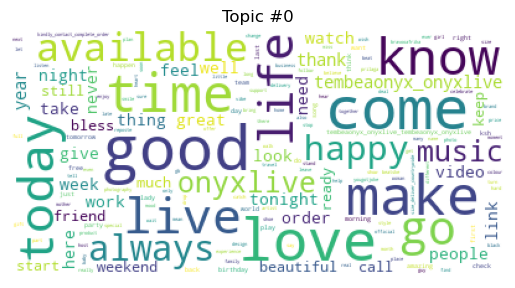

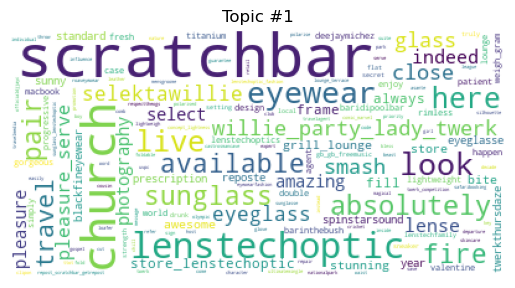

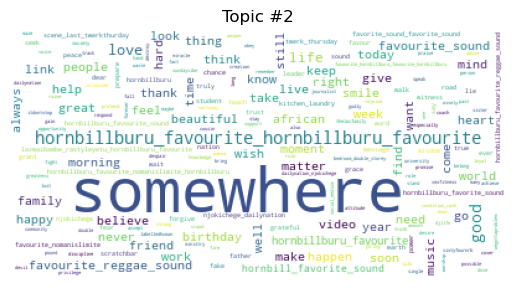

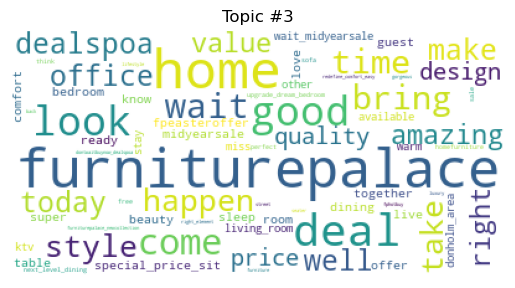

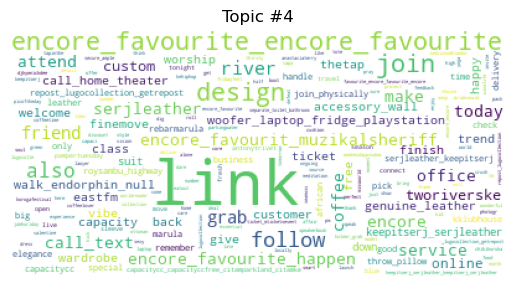

...

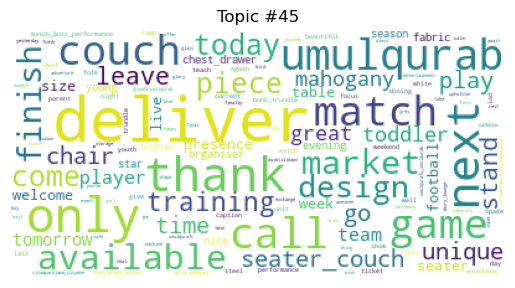

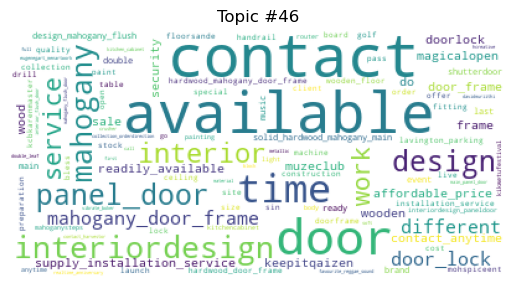

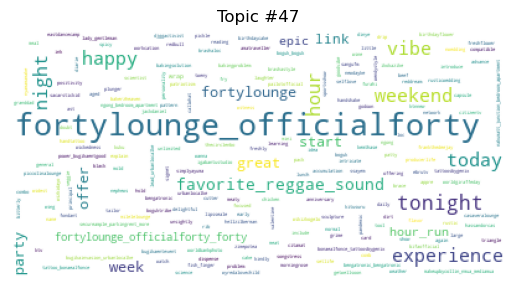

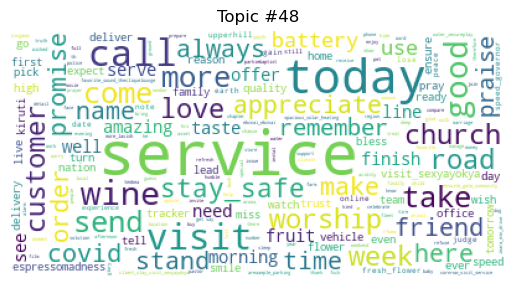

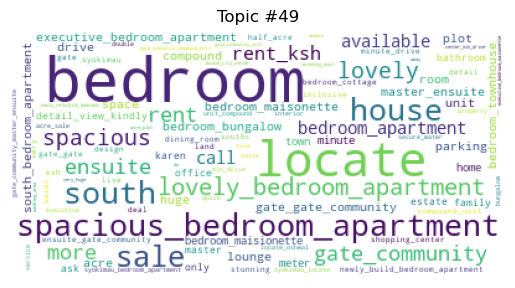

In [113]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

for t in range(lda_model.num_topics):
    plt.figure()
    plt.imshow(WordCloud(max_font_size=50, max_words = 300, background_color="white"). # Set word cloud parameters
               fit_words(dict(lda_model.show_topic(t, 200))))

    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.savefig(path + '/' + str(t) + '.png', dpi = 1000)
#     https://stackoverflow.com/questions/65271854/how-to-view-and-save-the-wordcloud-generated-in-python
    plt.show()

# wordcloud.to_file("img/first_review.png")

### LDA Model

In [114]:
# Export
lda_model.save(path + 'model.model')

In [115]:
# Reload
new_model = gensim.models.ldamodel.LdaModel.load(path + 'model.model')

In [116]:
# Copied from before to check if it is the same model 
test_doc = corpus[-1]

vector = new_model[test_doc]
print (vector)

def Sort(sub_li):
    sub_li.sort(key = lambda x: x[1])
    sub_li.reverse()
    return (sub_li)
new_vector = Sort(vector)
print (new_vector)

# 视频和上面表现一样的，这个不一样不知道为啥

[(33, 0.770255)]
[(33, 0.770255)]


### LDA Output df

In [117]:
Col = list(dfEnA.columns)
Col.append(list(range(num_topics)))

# new = pd.concat([dfEnA,pd.DataFrame(columns=newcol)])

In [118]:
from tqdm import tqdm

for i in tqdm(range(len(corpus))):
#     k = len(corpus[i])
#     print(k)

    vector = lda_model[corpus[i]]
#     print (vector)
#     print(len(vector))
    for seq in range(0, len(vector)):
#         print(vector[seq][0])
#         print(vector[seq][1])
        dfEnA.at[i, vector[seq][0]] = vector[seq][1]

100%|███████████████████████████████████| 10486/10486 [00:02<00:00, 3556.38it/s]


In [119]:
# Export
dfnew.to_csv(path + str(num_topics) + 'Full.csv', index = False)